<a href="https://colab.research.google.com/github/krittikabarua/Bird-Species-Identification-using-Supervised-Decision-Tree-Model-and-CNN-EfficientNet-Mode/blob/main/PRL_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow==2.9.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 11.6 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.5.26
    Uninstalling flatbuffers-23.5.26:
      Successfully uninstalled flatbuffers-23.5.26
  Attempting uninstall: ten

In [ ]:
# import system libs
import os
import time
import shutil
import pathlib
import itertools
from PIL import Image

# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers
# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


Data-Visualzation

In [ ]:
import cv2
import numpy as np
import os

def preprocess_image(image):
    if image is None:
        return None

    # Rotation
    angle = np.random.randint(-20, 20)  # Random angle between -20 and 20 degrees
    rows, cols, _ = image.shape
    rotation_matrix = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    image = cv2.warpAffine(image, rotation_matrix, (cols, rows))

    # Shearing
    shear_factor = np.random.uniform(-0.2, 0.2)  # Random shear factor between -0.2 and 0.2
    shear_matrix = np.array([[1, shear_factor, 0], [0, 1, 0]])
    image = cv2.warpAffine(image, shear_matrix, (cols, rows))

    # Blurring
    kernel_size = np.random.choice([3, 5])  # Random kernel size of 3x3 or 5x5
    image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

    # Grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Global Thresholding
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    # Canny Edge Detection
    edges = cv2.Canny(thresh, 100, 200)

    return edges  # Return the preprocessed image

# Path to your dataset directory
train_dir = '/content/drive/MyDrive/PRL_project/Bird_spices/train'

# Create a directory to save preprocessed images if it doesn't exist
#save_dir = '/content/drive/MyDrive/PRL_project/Bird_spices/preprocessed_train'
#if not os.path.exists(save_dir):
    #os.makedirs(train_dir)

# List all class folders in the train directory
class_folders = os.listdir(train_dir)

# Iterate through each class folder
for class_folder in class_folders:
    class_path = os.path.join(train_dir, class_folder)

    # Check if the path is a directory
    if os.path.isdir(class_path):
        print(f"Processing images from class folder: {class_folder}")

        # List all image files in the class folder
        image_files = os.listdir(class_path)

        # Iterate through each image file in the class folder
        for img_file in image_files:
            img_path = os.path.join(class_path, img_file)
            image = cv2.imread(img_path)

            # Check if image is read successfully
            if image is None:
                print(f"Unable to read image: {img_file}")
                continue

            # Apply preprocessing
            preprocessed_image = preprocess_image(image)

            # Save preprocessed image directly inside the class folder
            if preprocessed_image is not None:
                cv2.imwrite(os.path.join(class_path, f'preprocessed_{img_file}'), preprocessed_image)


Processing images from class folder: ANTBIRD
Processing images from class folder: ASIAN DOLLARD BIRD


KeyboardInterrupt: 

In [ ]:
import cv2
import numpy as np
import os

def preprocess_image(image):
    if image is None:
        return None

    # Rotation
    angle = np.random.randint(-20, 20)  # Random angle between -20 and 20 degrees
    rows, cols, _ = image.shape
    rotation_matrix = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    image = cv2.warpAffine(image, rotation_matrix, (cols, rows))

    # Shearing
    shear_factor = np.random.uniform(-0.2, 0.2)  # Random shear factor between -0.2 and 0.2
    shear_matrix = np.array([[1, shear_factor, 0], [0, 1, 0]])
    image = cv2.warpAffine(image, shear_matrix, (cols, rows))

    # Blurring
    kernel_size = np.random.choice([3, 5])  # Random kernel size of 3x3 or 5x5
    image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

    # Grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Global Thresholding
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    # Canny Edge Detection
    edges = cv2.Canny(thresh, 100, 200)

    return edges  # Return the preprocessed image

# Path to your dataset directory
test_dir = '/content/drive/MyDrive/PRL_project/Bird_spices/test'

# Create a directory to save preprocessed images if it doesn't exist
#save_dir = '/content/drive/MyDrive/PRL_project/Bird_spices/preprocessed_train'
#if not os.path.exists(save_dir):
    #os.makedirs(train_dir)

# List all class folders in the train directory
class_folders = os.listdir(test_dir)

# Iterate through each class folder
for class_folder in class_folders:
    class_path = os.path.join(test_dir, class_folder)

    # Check if the path is a directory
    if os.path.isdir(class_path):
        print(f"Processing images from class folder: {class_folder}")

        # List all image files in the class folder
        image_files = os.listdir(class_path)

        # Iterate through each image file in the class folder
        for img_file in image_files:
            img_path = os.path.join(class_path, img_file)
            image = cv2.imread(img_path)

            # Check if image is read successfully
            if image is None:
                print(f"Unable to read image: {img_file}")
                continue

            # Apply preprocessing
            preprocessed_image = preprocess_image(image)

            # Save preprocessed image directly inside the class folder
            if preprocessed_image is not None:
                cv2.imwrite(os.path.join(class_path, f'preprocessed_{img_file}'), preprocessed_image)

Processing images from class folder: EASTERN BLUEBONNET
Processing images from class folder: EASTERN BLUEBIRD
Processing images from class folder: EARED PITA
Processing images from class folder: DOWNY WOODPECKER
Processing images from class folder: DARJEELING WOODPECKER
Processing images from class folder: DARK EYED JUNCO
Processing images from class folder: DOUBLE EYED FIG PARROT
Processing images from class folder: DAURIAN REDSTART
Processing images from class folder: DALMATIAN PELICAN
Processing images from class folder: D-ARNAUDS BARBET
Processing images from class folder: AZURE TIT
Processing images from class folder: AZURE BREASTED PITTA
Processing images from class folder: AZURE TANAGER
Processing images from class folder: AUCKLAND SHAQ
Processing images from class folder: AZURE JAY
Processing images from class folder: AUSTRAL CANASTERO
Processing images from class folder: AZARAS SPINETAIL
Processing images from class folder: AVADAVAT
Processing images from class folder: AUSTRAL

In [ ]:
train_dir = '/content/drive/MyDrive/PRL_project/Bird_spices/train'
filepaths = []
labels = []

folds = os.listdir(train_dir)
for fold in folds:
    foldpath = os.path.join(train_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
train_df = pd.concat([Fseries, Lseries], axis= 1)

In [ ]:
train_df

,filepaths,labels
0,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
1,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
2,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
3,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
4,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
...,...,...
10981,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA
10982,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA
10983,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA
10984,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA


In [ ]:
valid_dir = '/content/drive/MyDrive/PRL_project/Bird_spices/valid'
filepaths = []
labels = []

folds = os.listdir(train_dir)
for fold in folds:
    foldpath = os.path.join(train_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
valid_df = pd.concat([Fseries, Lseries], axis= 1)

In [ ]:
valid_df

,filepaths,labels
0,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
1,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
2,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
3,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
4,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
...,...,...
10981,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA
10982,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA
10983,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA
10984,/content/drive/MyDrive/PRL_project/Bird_spices...,EARED PITA


In [ ]:
# Generate  test data paths with labels
test_dir = '/content/drive/MyDrive/PRL_project/Bird_spices/test'
filepaths = []
labels = []

folds = os.listdir(test_dir)
for fold in folds:
    foldpath = os.path.join(test_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
test_df = pd.concat([Fseries, Lseries], axis= 1)

In [ ]:
test_df

,filepaths,labels
0,/content/drive/MyDrive/PRL_project/Bird_spices...,EASTERN BLUEBONNET
1,/content/drive/MyDrive/PRL_project/Bird_spices...,EASTERN BLUEBONNET
2,/content/drive/MyDrive/PRL_project/Bird_spices...,EASTERN BLUEBONNET
3,/content/drive/MyDrive/PRL_project/Bird_spices...,EASTERN BLUEBONNET
4,/content/drive/MyDrive/PRL_project/Bird_spices...,EASTERN BLUEBONNET
...,...,...
739,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
740,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
741,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD
742,/content/drive/MyDrive/PRL_project/Bird_spices...,ANTBIRD


In [ ]:
# crobed image size
batch_size = 32
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator()
ts_gen = ImageDataGenerator()
train_gen = tr_gen.flow_from_dataframe( train_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)
valid_gen = ts_gen.flow_from_dataframe( valid_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = ts_gen.flow_from_dataframe( test_df, x_col= 'filepaths', y_col= 'labels', target_size= img_size, class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= batch_size)

Found 10986 validated image filenames belonging to 30 classes.
Found 10986 validated image filenames belonging to 30 classes.
Found 744 validated image filenames belonging to 30 classes.


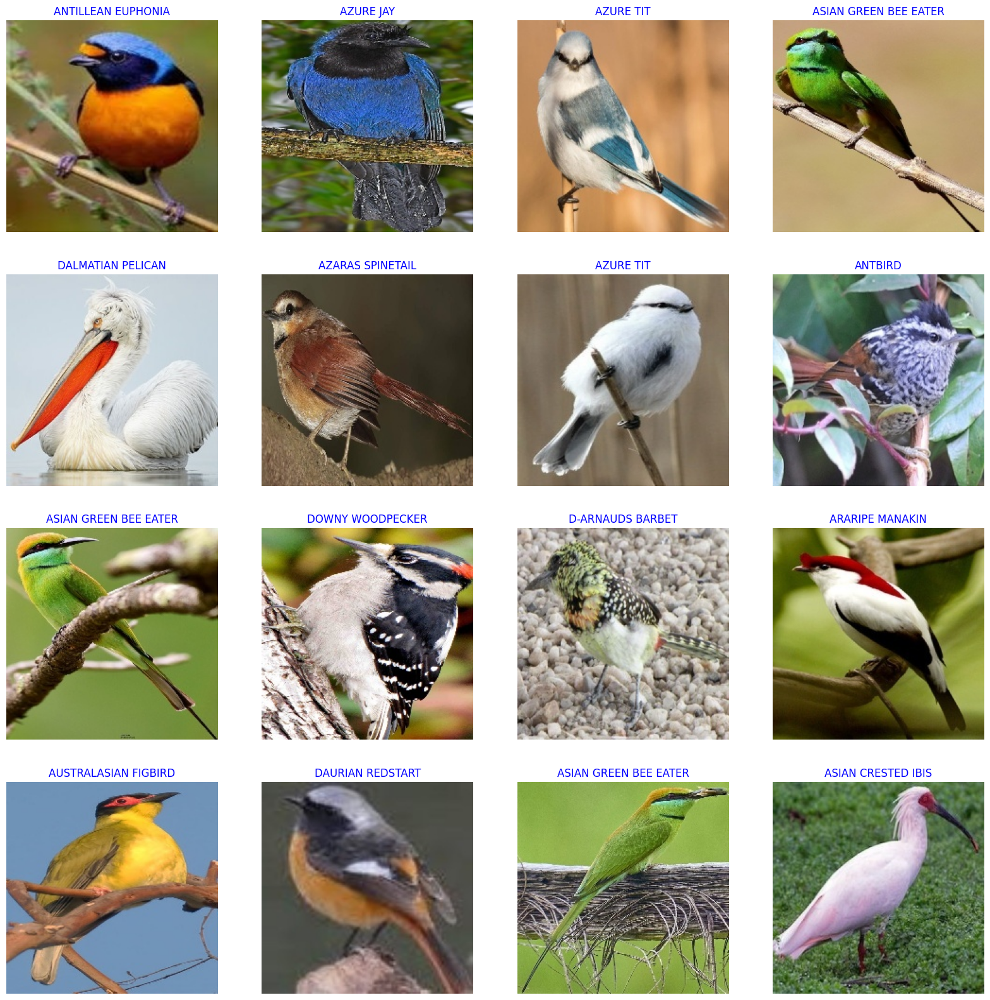

In [ ]:
g_dict = train_gen.class_indices      # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 12)
    plt.axis('off')
plt.show()

Shearing-Preprocessing

Found 4893 images belonging to 30 classes.


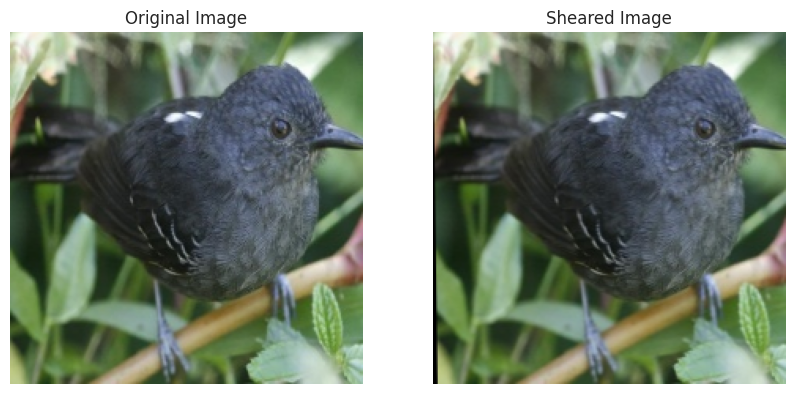

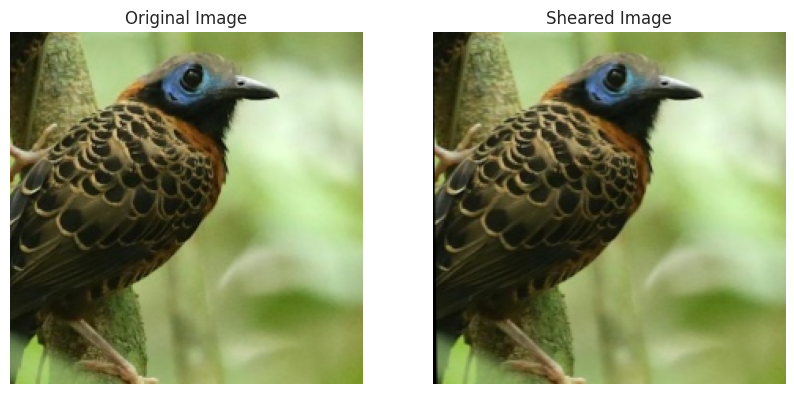

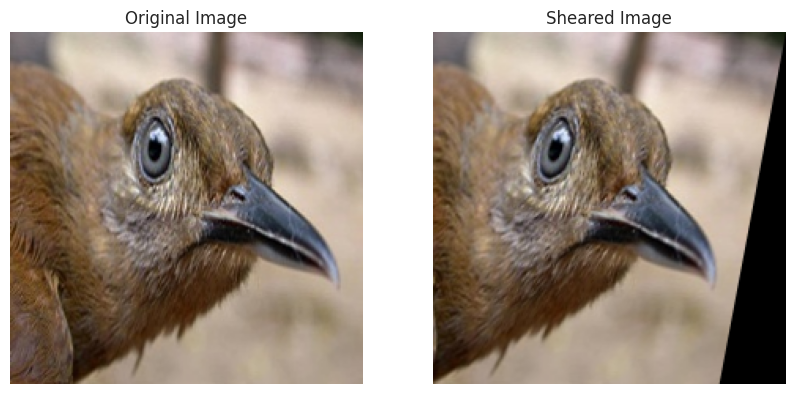

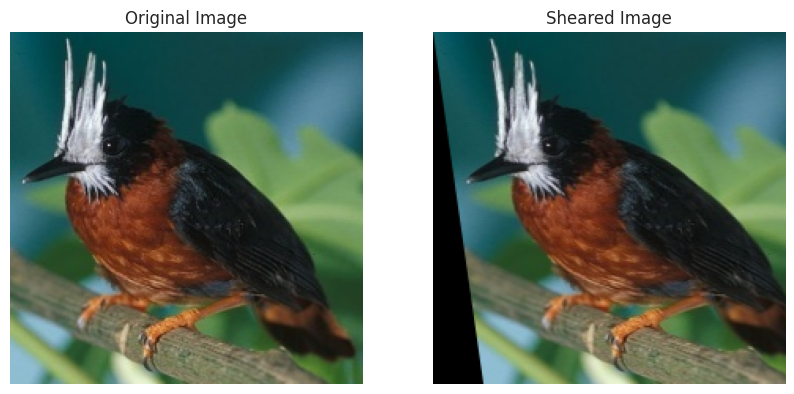

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Define shearing parameters
shear_params = {
    'shear_range': 0.2,  # Adjust as needed
    'row_axis': 0,
    'col_axis': 1,
    'channel_axis': 2
}

# Create an ImageDataGenerator with shearing augmentation
datagen = ImageDataGenerator(
    shear_range=shear_params['shear_range']
)

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Function to apply shearing to an image batch
def apply_shear_to_batch(batch_images, shear_range=0.2, row_axis=0, col_axis=1, channel_axis=2):
    sheared_images = []
    for image in batch_images:
        shear_factor = np.random.uniform(-shear_range, shear_range)
        shear_matrix = np.array([[1, -shear_factor, 0],
                                 [0, 1, 0],
                                 [0, 0, 1]])
        sheared_image = transform.warp(image, shear_matrix)
        sheared_images.append(sheared_image)
    return np.array(sheared_images)

# Iterate through the dataset generator and apply shearing
for batch_images, batch_labels in data_generator:
    sheared_batch_images = apply_shear_to_batch(batch_images, **shear_params)
    # Display 4 original and sheared images from the batch
    for i in range(4):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(batch_images[i].astype(np.uint8))
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title("Sheared Image")
        plt.imshow(sheared_batch_images[i].astype(np.uint8))
        plt.axis('off')

        plt.show()
    break  # Break after displaying the first batch


Rotation_Preprocessing

Found 4893 images belonging to 30 classes.


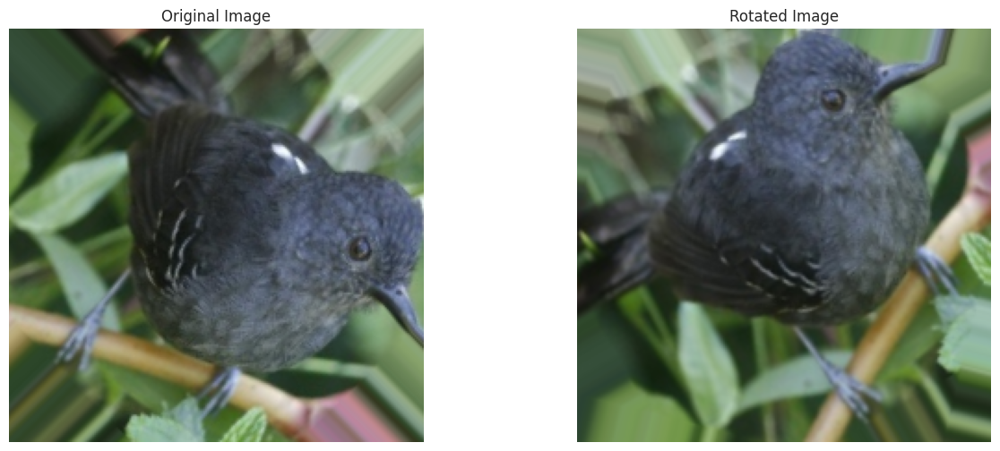

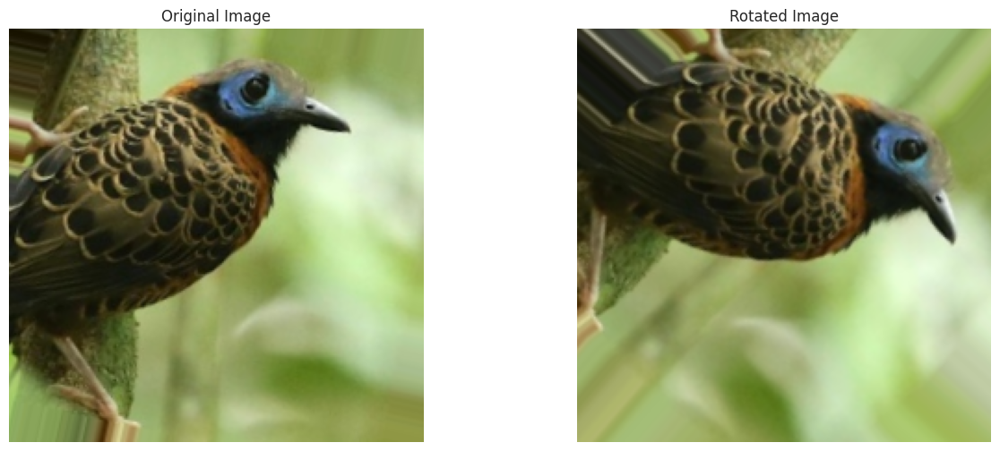

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Create an ImageDataGenerator with rotation augmentation
datagen = ImageDataGenerator(
    rotation_range=100,
    rescale=1./255  # Normalization: rescale pixel values to range [0,1]
)

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Display original and rotated images
for batch_images, batch_labels in data_generator:
    # Display 5 original and rotated images from the batch
    for i in range(2):
        plt.figure(figsize=(15, 6))

        # Plot original image
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(batch_images[i])
        plt.axis('off')

        # Apply rotation augmentation
        rotated_image = datagen.random_transform(batch_images[i])

        # Plot rotated image
        plt.subplot(1, 2, 2)
        plt.title("Rotated Image")
        plt.imshow(rotated_image)
        plt.axis('off')

        plt.show()

        if i == 4:
            break

    break  # Break after displaying the first batch



Bluring-Preprocessing

Found 4893 images belonging to 30 classes.


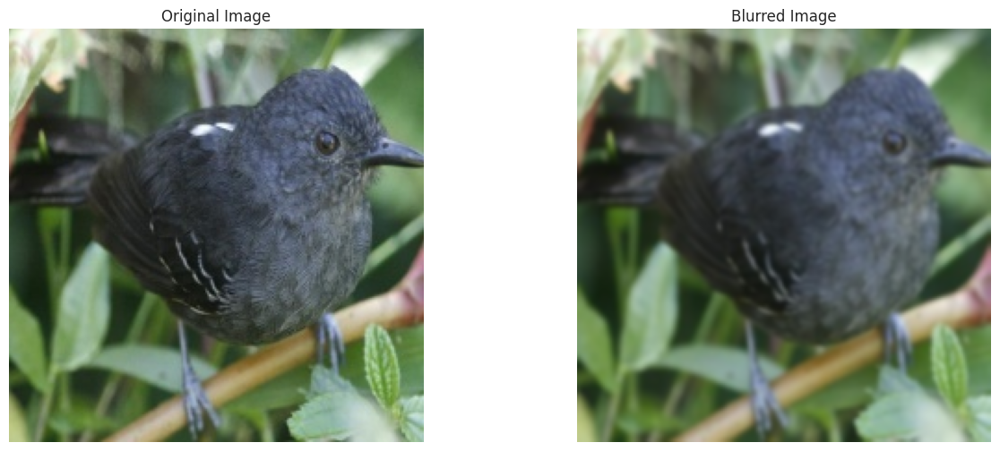

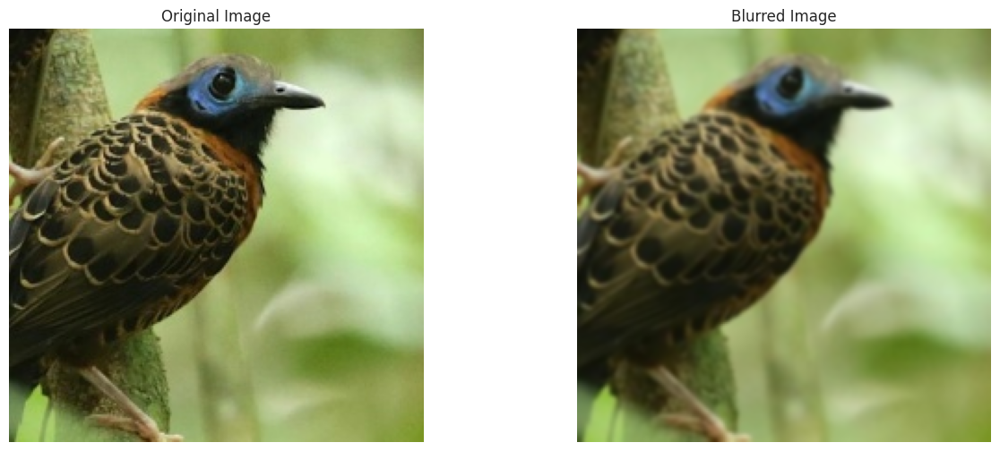

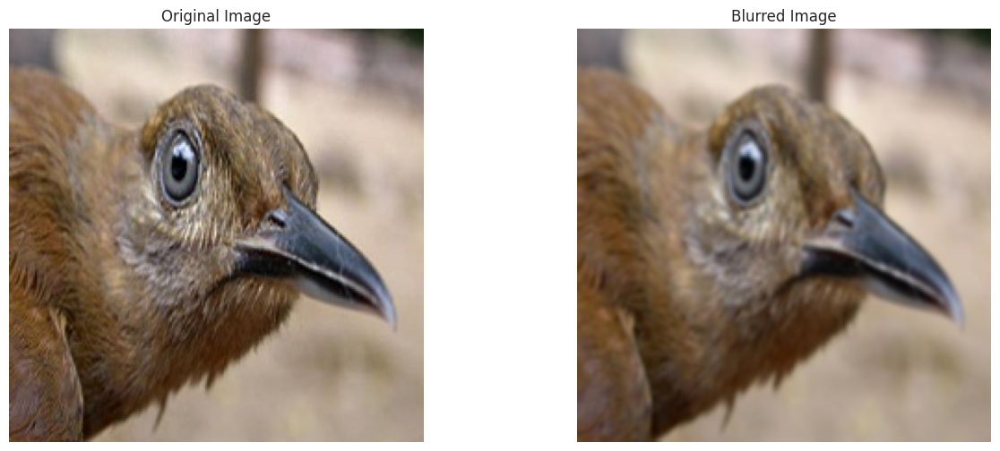

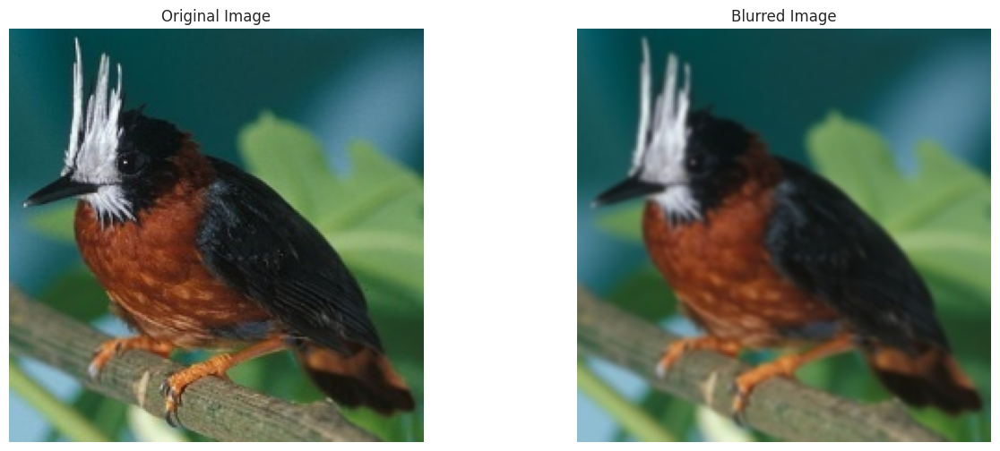

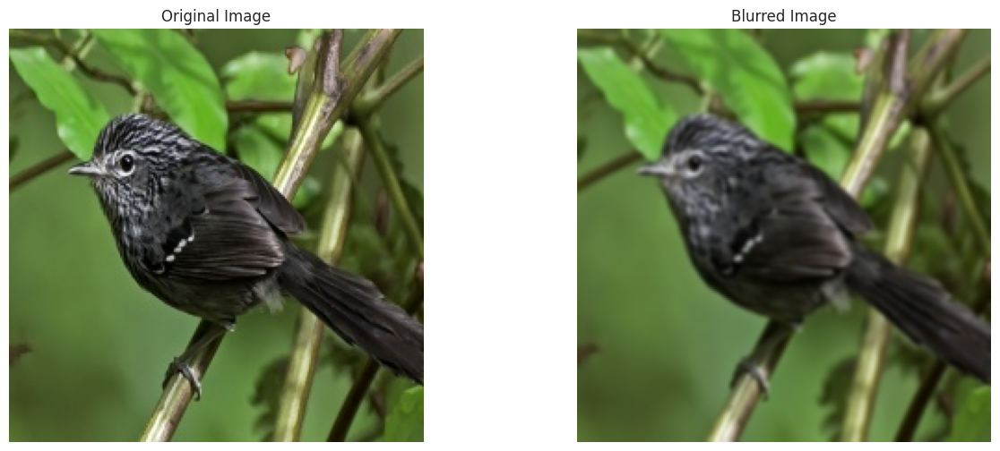

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Function to apply blur augmentation
def apply_blur(image):
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)  # Apply Gaussian blur with a kernel size of (5, 5)
    return blurred_image

# Create an ImageDataGenerator
datagen = ImageDataGenerator(
    rescale=1./255  # Normalization: rescale pixel values to range [0,1]
)

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Iterate through the dataset generator
for batch_images, batch_labels in data_generator:
    # Display 5 original and blurred images from the batch
    for i in range(5):
        plt.figure(figsize=(15, 6))

        # Plot original image
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(batch_images[i])
        plt.axis('off')

        # Apply blur augmentation
        blurred_image = apply_blur(batch_images[i])

        # Plot blurred image
        plt.subplot(1, 2, 2)
        plt.title("Blurred Image")
        plt.imshow(blurred_image)
        plt.axis('off')

        plt.show()

        if i == 4:
            break

    break  # Break after displaying the first batch


Global-thresholding

Found 4893 images belonging to 30 classes.


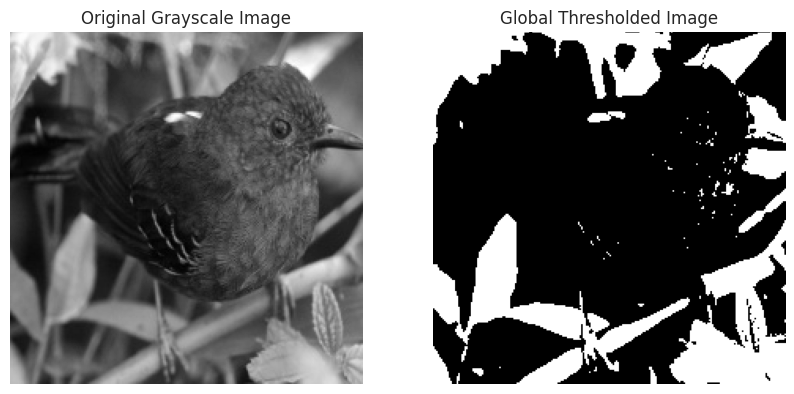

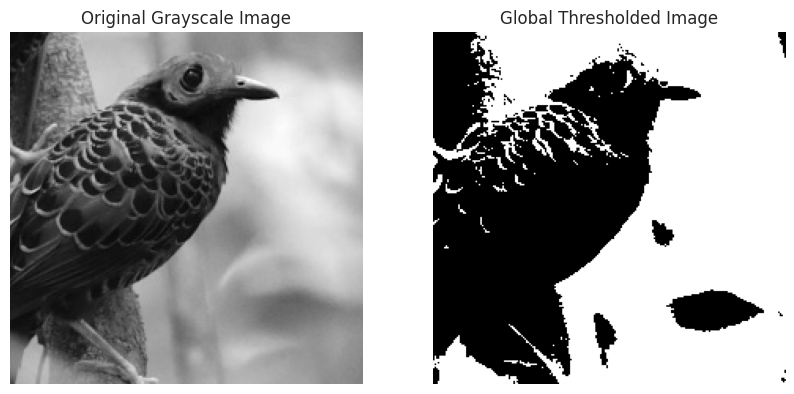

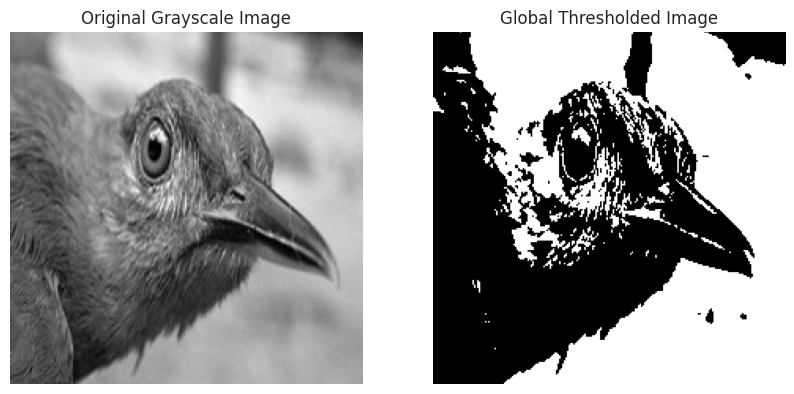

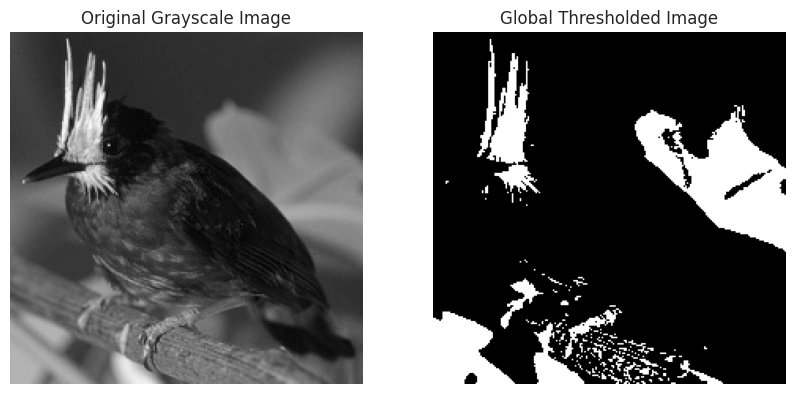

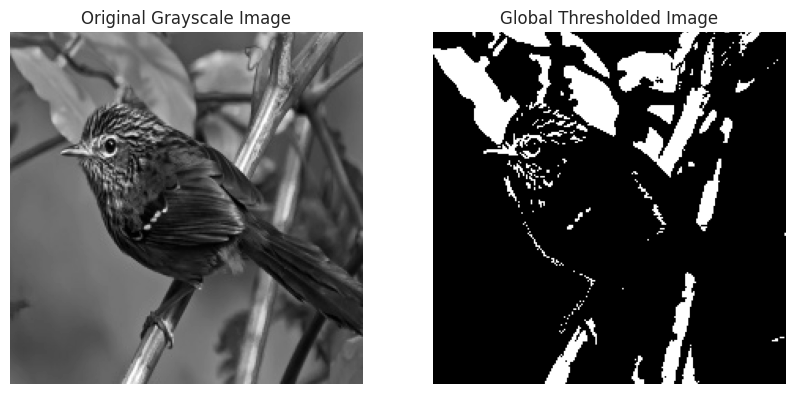

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Function to apply global thresholding
def apply_global_threshold(image):
    _, thresholded_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)  # Adjust threshold value as needed
    return thresholded_image

# Create an ImageDataGenerator without normalization
datagen = ImageDataGenerator()

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False,
    color_mode='grayscale'  # Load images in grayscale
)

# Iterate through the dataset generator
for batch_images, batch_labels in data_generator:
    # Display 5 original and thresholded images from the batch
    for i in range(5):
        plt.figure(figsize=(10, 5))

        # Plot original grayscale image
        plt.subplot(1, 2, 1)
        plt.title("Original Grayscale Image")
        plt.imshow(batch_images[i].squeeze(), cmap='gray')  # Squeeze to remove the channel dimension
        plt.axis('off')

        # Apply global thresholding
        thresholded_image = apply_global_threshold(batch_images[i].squeeze())

        # Plot thresholded image
        plt.subplot(1, 2, 2)
        plt.title("Global Thresholded Image")
        plt.imshow(thresholded_image, cmap='gray')
        plt.axis('off')

        plt.show()

    break  # Break after displaying the first batch


In [ ]:
!pip install opencv-python

Canny_edge_Detection

Found 4893 images belonging to 30 classes.


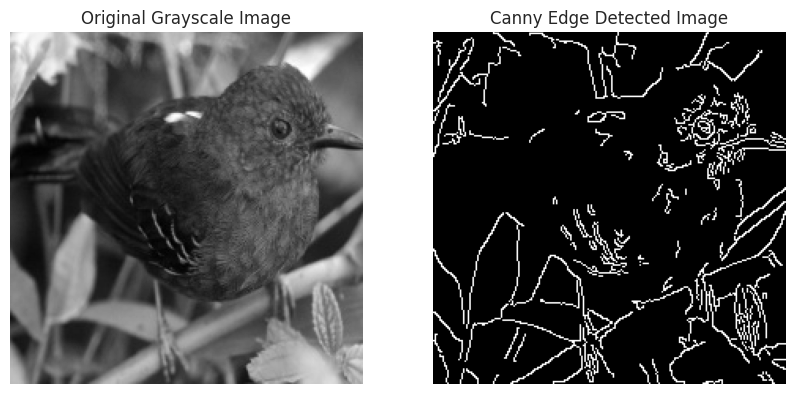

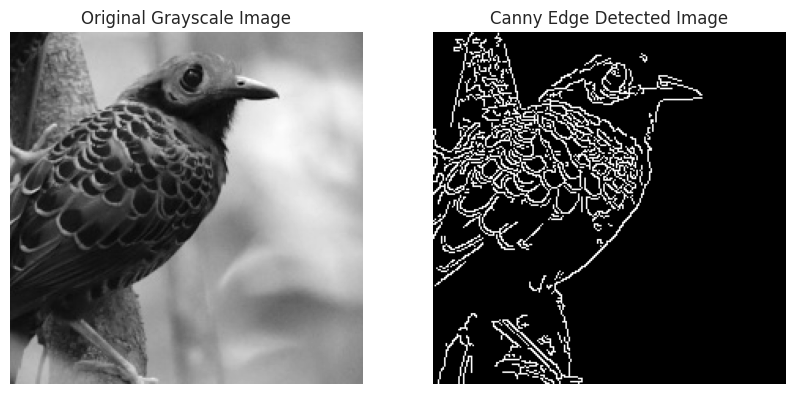

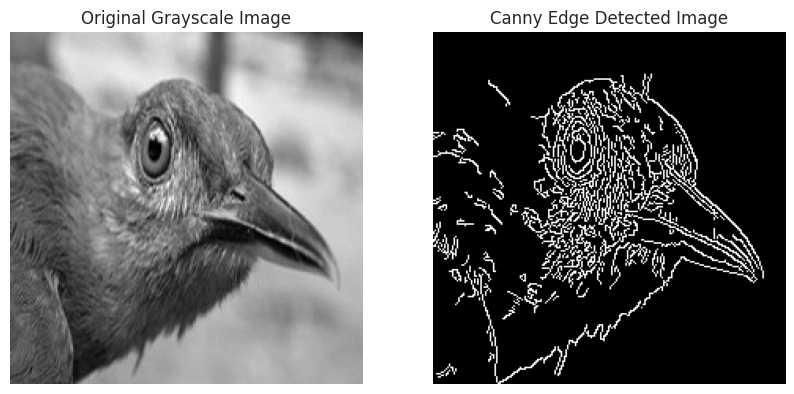

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define your dataset directory
#dataset_dir = "/content/drive/MyDrive/PRL_project/Bird_spices/train"

# Function to apply Canny edge detection
def apply_canny_edge_detection(image):
    edges = cv2.Canny(image, 100, 200)  # Adjust thresholds as needed
    return edges

# Create an ImageDataGenerator without normalization
datagen = ImageDataGenerator()

# Flow images from directory
data_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Adjust as needed
    batch_size=32,
    class_mode='categorical',
    shuffle=False,
    color_mode='grayscale'  # Load images in grayscale
)

# Iterate through the dataset generator
for batch_images, batch_labels in data_generator:
    # Display 5 original and edge-detected images from the batch
    for i in range(3):
        plt.figure(figsize=(10, 5))

        # Plot original grayscale image
        plt.subplot(1, 2, 1)
        plt.title("Original Grayscale Image")
        plt.imshow(batch_images[i].squeeze(), cmap='gray')  # Squeeze to remove the channel dimension
        plt.axis('off')

        # Apply Canny edge detection
        edge_image = apply_canny_edge_detection(batch_images[i].squeeze().astype(np.uint8))

        # Plot edge-detected image
        plt.subplot(1, 2, 2)
        plt.title("Canny Edge Detected Image")
        plt.imshow(edge_image, cmap='gray')
        plt.axis('off')

        plt.show()

    break  # Break after displaying the first batch


Decision Tree -Model

In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.models import Model
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score


# Load the pre-trained EfficientNetB0 model without the top classification layer
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the weights of the pre-trained model so they are not updated during training
base_model.trainable = False

# Define a new model with the desired output layer
feature_extractor = Model(inputs=base_model.input, outputs=base_model.output)

# Function to extract features from a batch of images
def extract_features(model, images):
    # Preprocess the images
    images = preprocess_input(images)
    # Extract features using the model
    features = model.predict(images)
    return features

# Extract features from training data
X_train = []
y_train = []
for _ in range(len(train_gen)):
    images, labels = train_gen.next()
    batch_features = extract_features(feature_extractor, images)
    X_train.extend(batch_features)
    y_train.extend(labels)


# Extract features from test data
X_test = []
y_test = []
for _ in range(len(test_gen)):
    images, labels = test_gen.next()
    batch_features = extract_features(feature_extractor, images)
    X_test.extend(batch_features)
    y_test.extend(labels)

# Convert lists to numpy arrays
X_train = np.array(X_train)
# Reshape X_train to have 2 dimensions
X_train = X_train.reshape(X_train.shape[0], -1)
y_train = np.array(y_train)

# Train the decision tree classifier
#dt_classifier.fit(X_train, y_train)

X_test = np.array(X_test)
X_test = X_test.reshape(X_test.shape[0], -1)
y_test = np.array(y_test)

# Initialize the decision tree classifier
dt_classifier = DecisionTreeClassifier()

# Train the decision tree classifier
dt_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_test_pred = dt_classifier.predict( X_test)

# Calculate accuracy on test data

accuracy_test = accuracy_score(y_test, y_test_pred)
print("Test Accuracy:", accuracy_test)


decision_train = round(dt_classifier.score(X_train, y_train) * 100, 2)
decision_accuracy = round(accuracy_score(y_test, y_test_pred ) * 100, 2)
print("Training Accuracy    :",decision_train ,"%")
print("Model Accuracy Score :",decision_accuracy ,"%")


1/1 [==============================] - 3s 3s/step


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-12-488ce26e8912>", line 31, in <cell line: 29>
    batch_features = extract_features(feature_extractor, images)
  File "<ipython-input-12-488ce26e8912>", line 23, in extract_features
    features = model.predict(images)
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2655, in predict
    tmp_batch_outputs = self.predict_function(iterator)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function

TypeError: object of type 'NoneType' has no len()

Effiencentnet model

In [ ]:

# Create Model Structure
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)
class_count = len(list(train_gen.class_indices.keys())) # to define number of classes in dense layer

# create pre-trained model (you can built on pretrained model such as :  efficientnet, VGG , Resnet )
# we will use efficientnetb3 from EfficientNet family.
base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top= False, weights= "imagenet", input_shape= img_shape, pooling= 'max')
# base_model.trainable = False
model = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 123),
    Dense(class_count, activation= 'softmax')
])

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 1280)              4049571   
 )                                                               
                                                                 
 batch_normalization_1 (Bat  (None, 1280)              5120      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 256)               327936    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 30)                7710      
                                                                 
Total params: 4390337 (16.75 MB)
Trainable params: 434

Train model

In [ ]:
batch_size = 32   # set batch size for training
epochs =  2  # number of all epochs in training
history = model.fit(x= train_gen, epochs= epochs, verbose= 1, validation_data= valid_gen,
                    validation_steps= None, shuffle= False)
test_loss, test_accuracy = model.evaluate(test_gen, verbose=1)

# Get training and validation accuracy
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Print the training and validation accuracy
print(f'Training Accuracy: {train_accuracy[-1]:.4f}')
print(f'Validation Accuracy: {val_accuracy[-1]:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

Epoch 1/2
344/344 [==============================] - 4466s 13s/step - loss: 7.9091 - accuracy: 0.3702 - val_loss: 5.6360 - val_accuracy: 0.5732
Epoch 2/2
24/24 [==============================] - 167s 7s/step - loss: 4.8389 - accuracy: 0.3616
Training Accuracy: 0.5547
Validation Accuracy: 0.6866
Test Accuracy: 0.3616


Display model performance

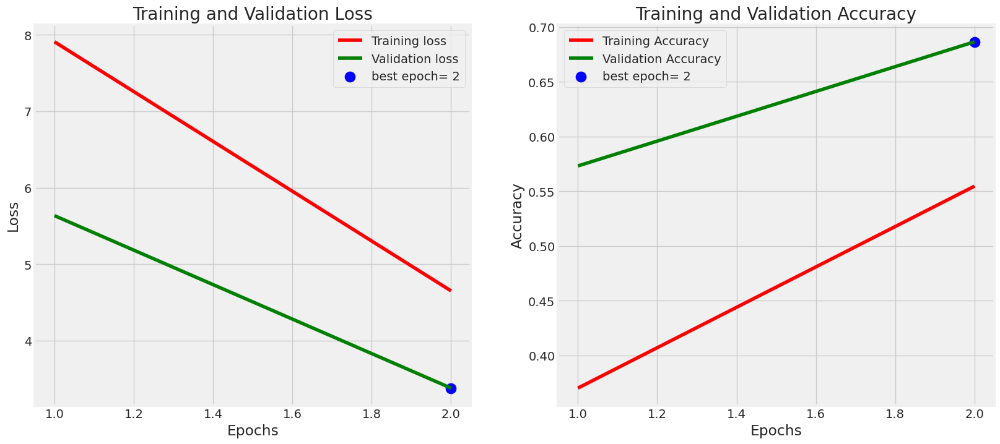

In [ ]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'
# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')
plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout
plt.show()

Evaluate model

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)
print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

12/12 [==============================] - 29s 2s/step - loss: 4.8606 - accuracy: 0.3542
Train Loss:  3.3776493072509766
Train Accuracy:  0.6770833134651184
--------------------
Validation Loss:  3.3339731693267822
Validation Accuracy:  0.7057291865348816
--------------------
Test Loss:  4.860589981079102
Test Accuracy:  0.3541666567325592


Get Predictions

In [ ]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

Confusion Matrics and Classification Report

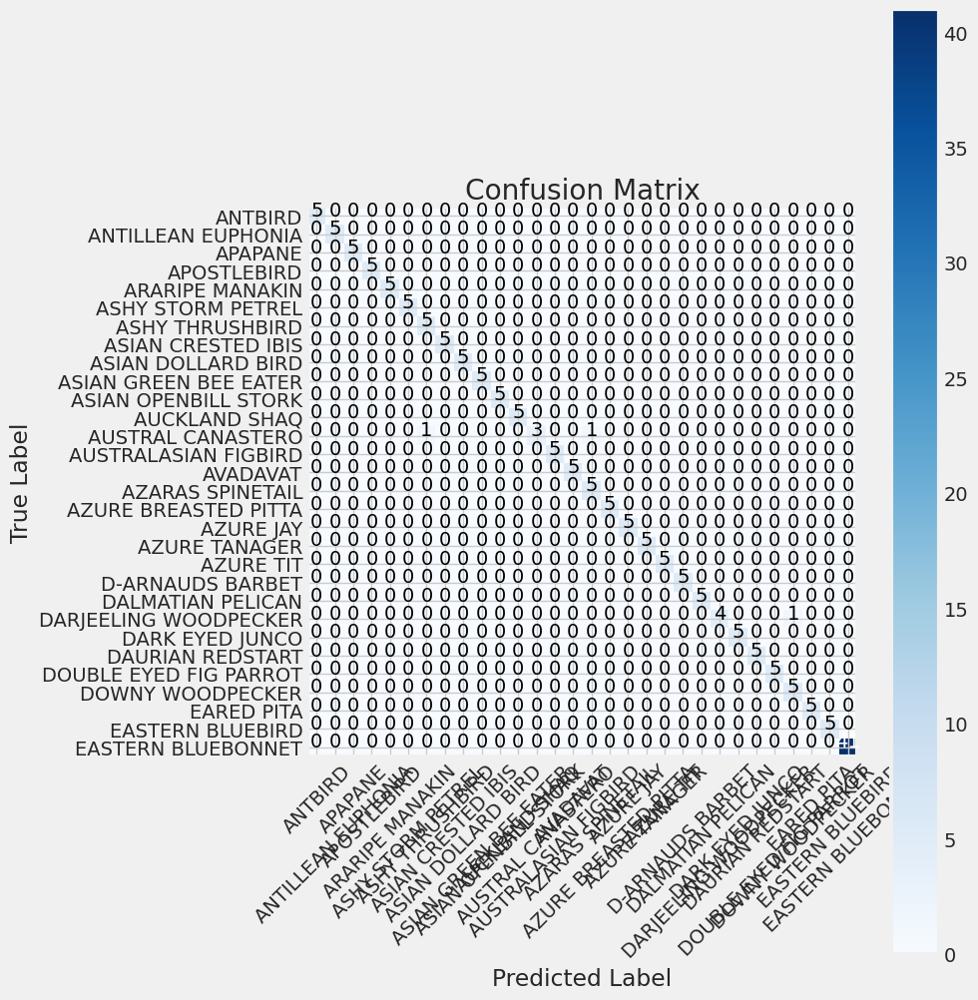

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')
    plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
# Classification report
g_dict = test_gen.class_indices
classes = list(g_dict.keys())
print(classification_report(test_gen.classes, y_pred, target_names= classes))

                        precision    recall  f1-score   support

               ANTBIRD       0.60      0.30      0.40        20
    ANTILLEAN EUPHONIA       1.00      0.25      0.40        20
               APAPANE       1.00      0.25      0.40        20
           APOSTLEBIRD       0.67      0.30      0.41        20
       ARARIPE MANAKIN       1.00      0.45      0.62        20
     ASHY STORM PETREL       0.67      0.50      0.57        20
       ASHY THRUSHBIRD       0.50      0.50      0.50        20
    ASIAN CRESTED IBIS       0.73      0.40      0.52        20
    ASIAN DOLLARD BIRD       0.56      0.25      0.34        20
 ASIAN GREEN BEE EATER       0.32      0.35      0.33        20
  ASIAN OPENBILL STORK       0.10      0.45      0.17        20
         AUCKLAND SHAQ       0.06      0.80      0.11        20
     AUSTRAL CANASTERO       0.42      0.40      0.41        20
  AUSTRALASIAN FIGBIRD       0.35      0.30      0.32        20
              AVADAVAT       0.88      

Save model

In [ ]:
model.save('/content/drive/MyDrive/PRL_project/Bird_spices/EfficientNetB0-525-(224 X 224)- 98.97.h5')

In [ ]:
loaded_model = tf.keras.models.load_model('/content/drive/MyDrive/PRL_project/Bird_spices/EfficientNetB0-525-(224 X 224)- 98.97.h5', compile=False)
loaded_model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

ROC_CURVE

24/24 [==============================] - 59s 2s/step


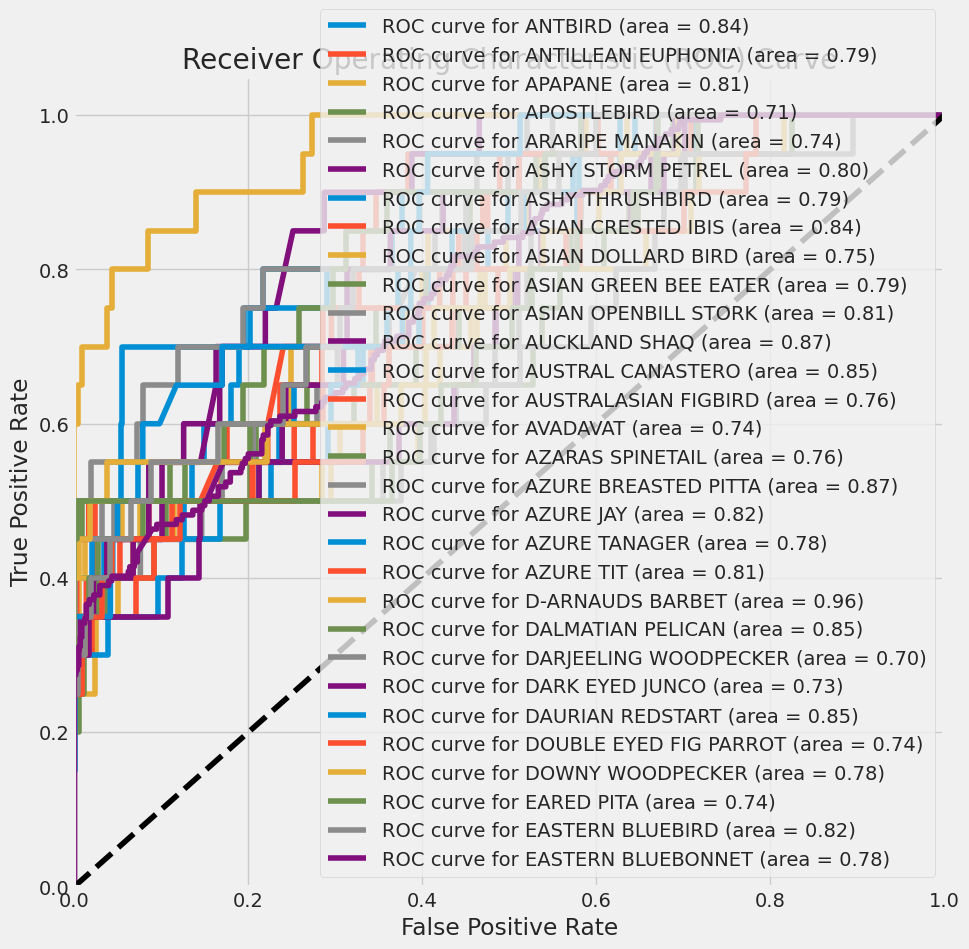

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have your test generator 'test_gen' and your EfficientNet model 'loaded_model' already defined

# Generate predictions
y_pred_probs = loaded_model.predict(test_gen)

# Convert true labels to one-hot encoding
y_true = label_binarize(test_gen.classes, classes=np.arange(len(classes)))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 10))
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], label='ROC curve for {} (area = {:.2f})'.format(classes[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')  # Plot diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


Prediction using loaded_model

In [ ]:
image_path = '/content/drive/MyDrive/PRL_project/Bird_spices/test/DALMATIAN PELICAN/4.jpg'
image = Image.open(image_path)

# Preprocess the image
img = image.resize((224, 224))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)

# Make predictions
predictions = loaded_model.predict(img_array)
class_labels = classes
score = tf.nn.softmax(predictions[0])
print(f"{class_labels[tf.argmax(score)]}")

1/1 [==============================] - 0s 263ms/step
DALMATIAN PELICAN


1/1 [==============================] - 0s 171ms/step


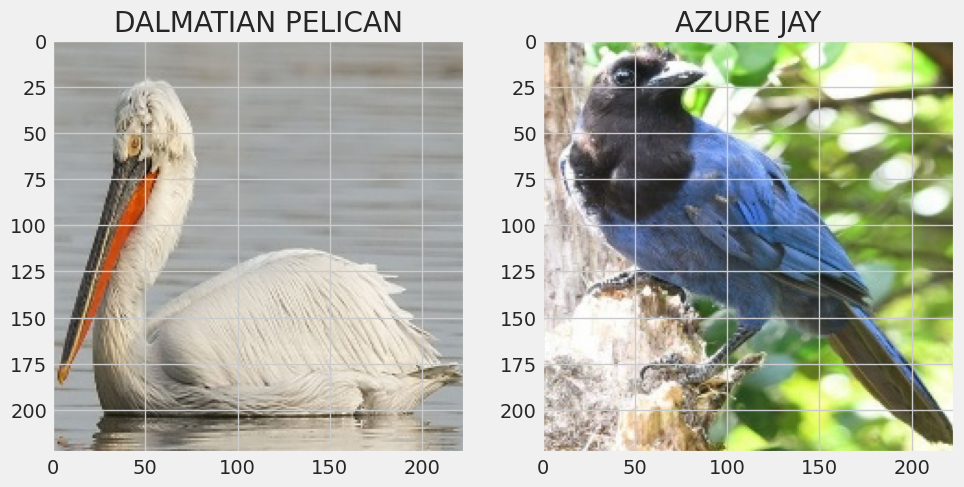

In [ ]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt



# Function to preprocess, predict, and display an image
def preprocess_predict_display(image_path, ax):
    # Load and preprocess the image
    image = Image.open(image_path)
    img = image.resize((224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    # Make predictions
    predictions = loaded_model.predict(img_array)
    class_labels = classes
    score = tf.nn.softmax(predictions[0])
    predicted_class = class_labels[tf.argmax(score)]

    # Display the image and predicted label
    ax.imshow(image)
    ax.set_title(predicted_class)

# Paths to your two images
image_paths = ['/content/drive/MyDrive/PRL_project/Bird_spices/test/DALMATIAN PELICAN/3.jpg',
               '/content/drive/MyDrive/PRL_project/Bird_spices/test/AZURE JAY/2.jpg']

# Create a horizontal subplot
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Process, predict, and display each image
for i, path in enumerate(image_paths):
    preprocess_predict_display(path, axes[i])

plt.tight_layout()
plt.show()
